# Visualization Libraries

| Library        | Type        | Interactivity | Best Use Case                      |
| -------------- | ----------- | ------------- | ---------------------------------- |
| **Matplotlib** | Static      | ❌ No          | Academic publishing, PDFs, reports |
| **Folium**     | Interactive | ✅ Yes         | Public web maps, story maps        |
| **Leafmap**    | Interactive | ✅ Yes         | Jupyter exploration, education     |
| **Lombard**    | Interactive | ✅ Yes         | Large data rendering, vector tiles |


In [6]:
import geopandas as gpd

# Load datasets
states_url = '../geopandas_101_DATA/us/cb_2022_us_state_500k.zip'
plants_url = "../geopandas_101_DATA/us/Power_Plants_in_the_US_5860152164617264051.geojson"

states = gpd.read_file(states_url)
plants = gpd.read_file(plants_url)

# Ensure same CRS for compatibility
states = states.to_crs("EPSG:4326")
plants = plants.to_crs(states.crs)

# 1️⃣ Matplotlib: Static Map
✅ Use case: Best for static maps for publication, reports, or PDFs. Fast and customizable but not interactive.

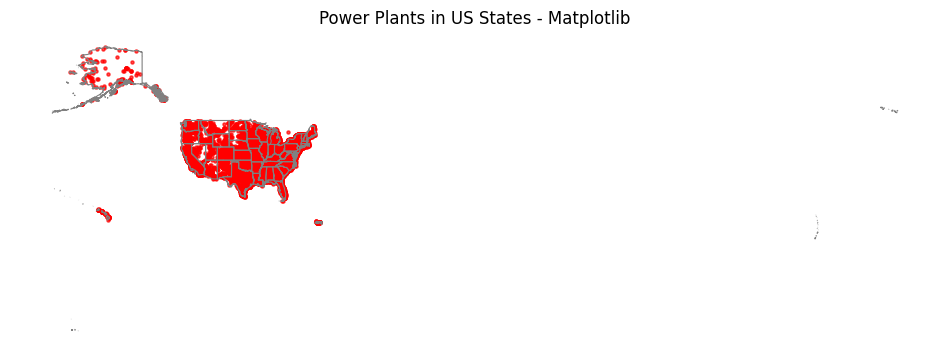

In [10]:
import matplotlib.pyplot as plt

# Create a static map figure and axes
fig, ax = plt.subplots(figsize=(12, 8))

# Plot state boundaries with no fill, light gray borders
states.boundary.plot(ax=ax, linewidth=0.8, edgecolor="gray")

# Plot power plants as red dots
plants.plot(ax=ax, color="red", markersize=5, alpha=0.7)

# Set title and hide axes
ax.set_title("Power Plants in US States - Matplotlib")
ax.axis("off")
plt.show()


# 2️⃣ Folium: Interactive Web Map
✅ Use case: Excellent for public-facing maps, lightweight sharing (HTML), and interactive exploration.

In [14]:
import folium
from folium.plugins import MarkerCluster

# Create a folium map centered on the U.S.
m = folium.Map(location=[39.5, -98.5], zoom_start=4, tiles="CartoDB positron")

# Add clustering for power plants (reduces marker clutter)
marker_cluster = MarkerCluster().add_to(m)

# Loop through GeoDataFrame and add each plant as a marker
for _, row in plants.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row.get("plant_name", "Power Plant")  # Optional: Show name on click
    ).add_to(marker_cluster)

# Save the result to a local HTML file
m.save("folium_map.html")
m

# 3️⃣ Leafmap: Widget-based Exploration
✅ Use case: Easy for users familiar with Jupyter. Provides toggleable layers, basemaps, and more styling flexibility.

In [24]:
import leafmap

# Create a Leafmap viewer object
leafmap_map = leafmap.Map()

# Add both GeoDataFrames as separate layers
leafmap_map.add_gdf(states, layer_name="States")
leafmap_map.add_gdf(plants, layer_name="Power Plants")
# leafmap_map.add_gdf(plants[plants['Total_MW']>1000], layer_name="Power Plants")

# Export as interactive HTML
leafmap_map.to_html("leafmap_map.html")
leafmap_map

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

# 4️⃣ Lombard: Symbolic Mapping
✅ Use case: Ideal when you want to show custom point symbols (like PNGs) on interactive maps. Great for dashboards or categorical displays.

In [25]:
import lombard as lomb

# Create an interactive map with Lombard
lmap = lomb.Map()

# Add polygons for U.S. states (styled with fill and borders)
lmap.add_geojson(states, style={
    "fillColor": "#cccccc",
    "color": "white"
})

# Add points for power plants using default circle symbols
lmap.add_geojson(plants, symbol={
    "shape": "circle",
    "color": "crimson",
    "size": 6
})

# Display the map inline
lmap.show()


AttributeError: module 'lombard' has no attribute 'Map'